Calculate the Bayes Factor for $M_*$ to determine whether the void and wall samples are drawn from the same or different parent distributions.

In [1]:
from astropy.table import Table
from astropy.io import fits

import numpy as np

import sys

import pickle

import pocomc as pc

import matplotlib
import matplotlib.pyplot as plt

from functions import Model_1_plot, Model_2_plot

np.set_printoptions(threshold=sys.maxsize)

In [3]:
matplotlib.rc('font', size=14)
matplotlib.rc('font', family='DejaVu Sans')

# Data

In [4]:
#data_directory = '../../../../data/'
data_directory = '../../../../Data/NSA/'
data_filename = data_directory + 'nsa_v1_0_1_VAGC_vflag-V2_sys.fits'

hdu = fits.open(data_filename)
data = Table(hdu[1].data)
hdu.close()

## Just keep the main SDSS DR7 footprint

In [5]:
# When the catalog is the NSA, only keep those objects which were originally in the DR7 LSS
catalog_SDSS = data[data['IN_DR7_LSS'] == 1]

ra_boolean = np.logical_and(catalog_SDSS['RA'] > 110, catalog_SDSS['RA'] < 270)
catalog_north = catalog_SDSS[ra_boolean]

strip_boolean = np.logical_and.reduce([catalog_north['RA'] > 250, 
                                       catalog_north['RA'] < 269, 
                                       catalog_north['DEC'] > 51, 
                                       catalog_north['DEC'] < 67])
catalog_main = catalog_north[~strip_boolean]

In [6]:
Mstar_NSA = np.log10(catalog_main['ELPETRO_MASS'])

/opt/anaconda/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: divide by zero encountered in log10
  """Entry point for launching an IPython kernel.


# Separate galaxies by their $V^2$ LSS classifications

## $0.2\overline{\rho}$, no $R_{\rm min}$ cut

In [7]:
wall_noRmin = catalog_main['vflag_V2_noRmin'] == 0
void_noRmin = catalog_main['vflag_V2_noRmin'] == 1
edge_noRmin = catalog_main['vflag_V2_noRmin'] == 2
out_noRmin = catalog_main['vflag_V2_noRmin'] == 9

## $0.1\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

In [8]:
wall_0p1 = catalog_main['vflag_V2_0p1rho'] == 0
void_0p1 = catalog_main['vflag_V2_0p1rho'] == 1
edge_0p1 = catalog_main['vflag_V2_0p1rho'] == 2
out_0p1 = catalog_main['vflag_V2_0p1rho'] == 9

## $0.3\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

In [9]:
wall_0p3 = catalog_main['vflag_V2_0p3rho'] == 0
void_0p3 = catalog_main['vflag_V2_0p3rho'] == 1
edge_0p3 = catalog_main['vflag_V2_0p3rho'] == 2
out_0p3 = catalog_main['vflag_V2_0p3rho'] == 9

In [10]:
del catalog_main, catalog_north, data

# Fit the stellar mass distributions with skewnormal distributions

Both one- and two-parent models

This is a unimodal distribution

In [11]:
Mstar_bins = np.arange(7.5, 11.5, 0.1)

In [12]:
labels1_bi = ['s', 'a', r'$\mu_a$', r'$\sigma_a$', 'skew$_a$', 
                   'b', r'$\mu_b$', r'$\sigma_b$', 'skew$_b$']
labels2_bi = ['$a_1$', r'$\mu_{1a}$', r'$\sigma_{1a}$', 'skew$_{1a}$', 
              '$b_1$', r'$\mu_{1b}$', r'$\sigma_{1b}$', 'skew$_{1b}$', 
              '$a_2$', r'$\mu_{2a}$', r'$\sigma_{2a}$', 'skew$_{2a}$', 
              '$b_2$', r'$\mu_{2b}$', r'$\sigma_{2b}$', 'skew$_{2b}$']

## $0.2\overline{\rho}$, no $R_{\rm min}$ cut

### 1-parent model

In [13]:
temp_infile = open('pocoMC_results/sampler_results_M1_Mstar_V2-noRmin.pickle', 'rb')
V2noRmin_results1 = pickle.load(temp_infile)
temp_infile.close()

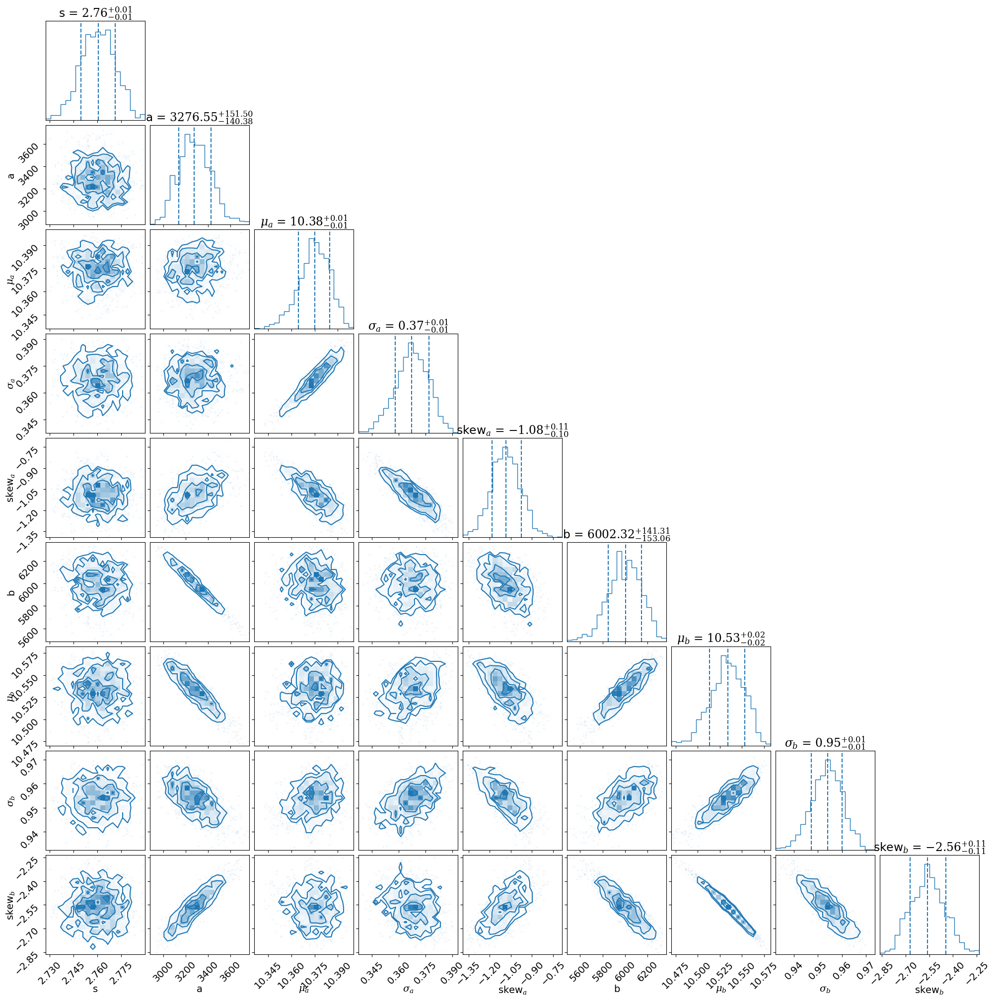

In [14]:
pc.plotting.corner(V2noRmin_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84]);

In [15]:
lnzM1_V2noRmin = V2noRmin_results1['logz'][-1]
lnzM1_V2noRmin

-1026.382611064933

In [16]:
V2noRmin_Mstar_bestfit1 = np.mean(V2noRmin_results1['samples'], axis=0)

V2noRmin_Mstar_bestfit1

array([ 2.7602584e+00,  3.2837271e+03,  1.0374534e+01,  3.6734775e-01,
       -1.0841004e+00,  5.9949810e+03,  1.0532809e+01,  9.5367503e-01,
       -2.5586722e+00], dtype=float32)

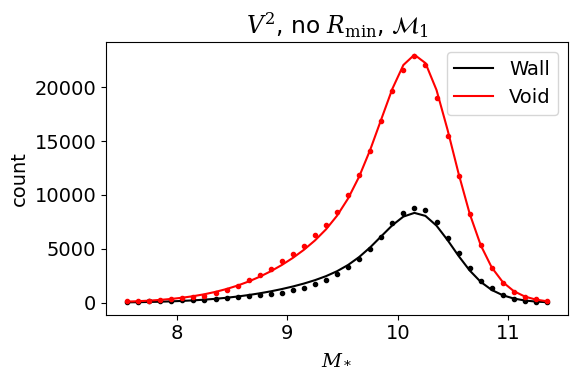

In [17]:
Model_1_plot(V2noRmin_Mstar_bestfit1, 
             Mstar_NSA[wall_noRmin], 
             Mstar_NSA[void_noRmin], 
             Mstar_bins, 
             2, 
             xlabel_text='$M_*$', 
             title_text=r'$V^2$, no $R_{\rm min}$, $\mathcal{M}_1$')

### 2-parent model

In [20]:
temp_infile = open('pocoMC_results/sampler_results_M2_Mstar_V2-noRmin.pickle', 'rb')
V2noRmin_results2 = pickle.load(temp_infile)
temp_infile.close()

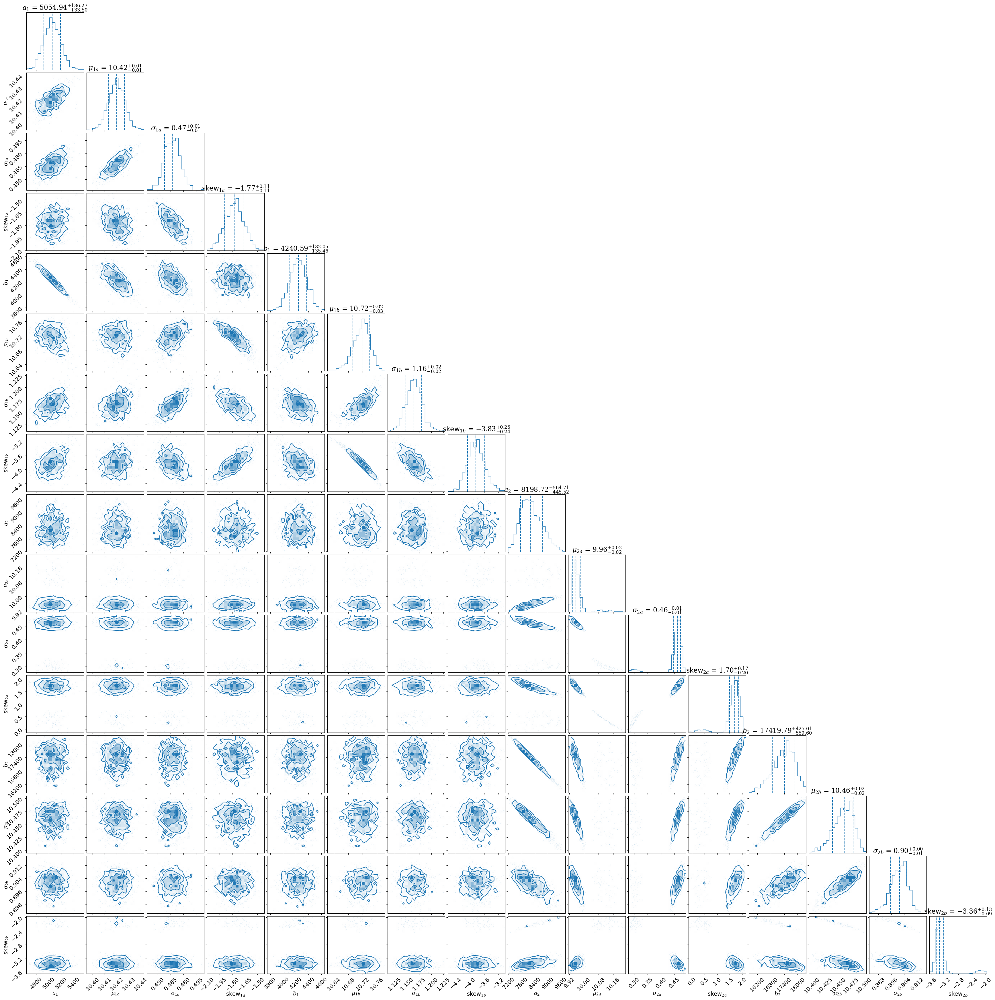

In [21]:
pc.plotting.corner(V2noRmin_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84]);

In [22]:
lnzM2_V2noRmin = V2noRmin_results2['logz'][-1]
lnzM1_V2noRmin

-1026.382611064933

In [23]:
V2noRmin_Mstar_bestfit2 = np.mean(V2noRmin_results2['samples'], axis=0)

V2noRmin_Mstar_bestfit2

array([ 5.05538721e+03,  1.04198093e+01,  4.67075765e-01, -1.77493465e+00,
        4.23779004e+03,  1.07159557e+01,  1.16468596e+00, -3.82376456e+00,
        8.24732617e+03,  9.96702766e+00,  4.50605810e-01,  1.61406136e+00,
        1.73623887e+04,  1.04600315e+01,  9.00665045e-01, -3.27731419e+00],
      dtype=float32)

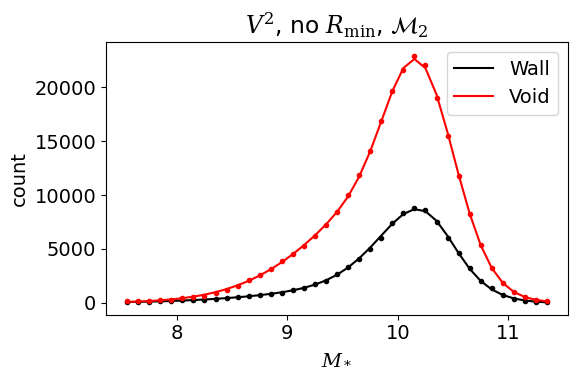

In [24]:
Model_2_plot(V2noRmin_Mstar_bestfit2, 
             Mstar_NSA[wall_noRmin], 
             Mstar_NSA[void_noRmin], 
             Mstar_bins, 
             2, 
             xlabel_text='$M_*$', 
             title_text=r'$V^2$, no $R_{\rm min}$, $\mathcal{M}_2$')

### Calculate Bayes factor

In [25]:
lnB12_V2noRmin = lnzM1_V2noRmin - lnzM2_V2noRmin

B12_V2noRmin = np.exp(lnB12_V2noRmin)

print('V2 M*: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2noRmin, lnB12_V2noRmin*np.log10(np.exp(1))))

V2 M*: B12 = 1.78e-223; log(B12) = -222.748


## $0.1\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

### 1-parent model

In [26]:
temp_infile = open('pocoMC_results/sampler_results_M1_Mstar_V2-0p1.pickle', 'rb')
V2_0p1_results1 = pickle.load(temp_infile)
temp_infile.close()

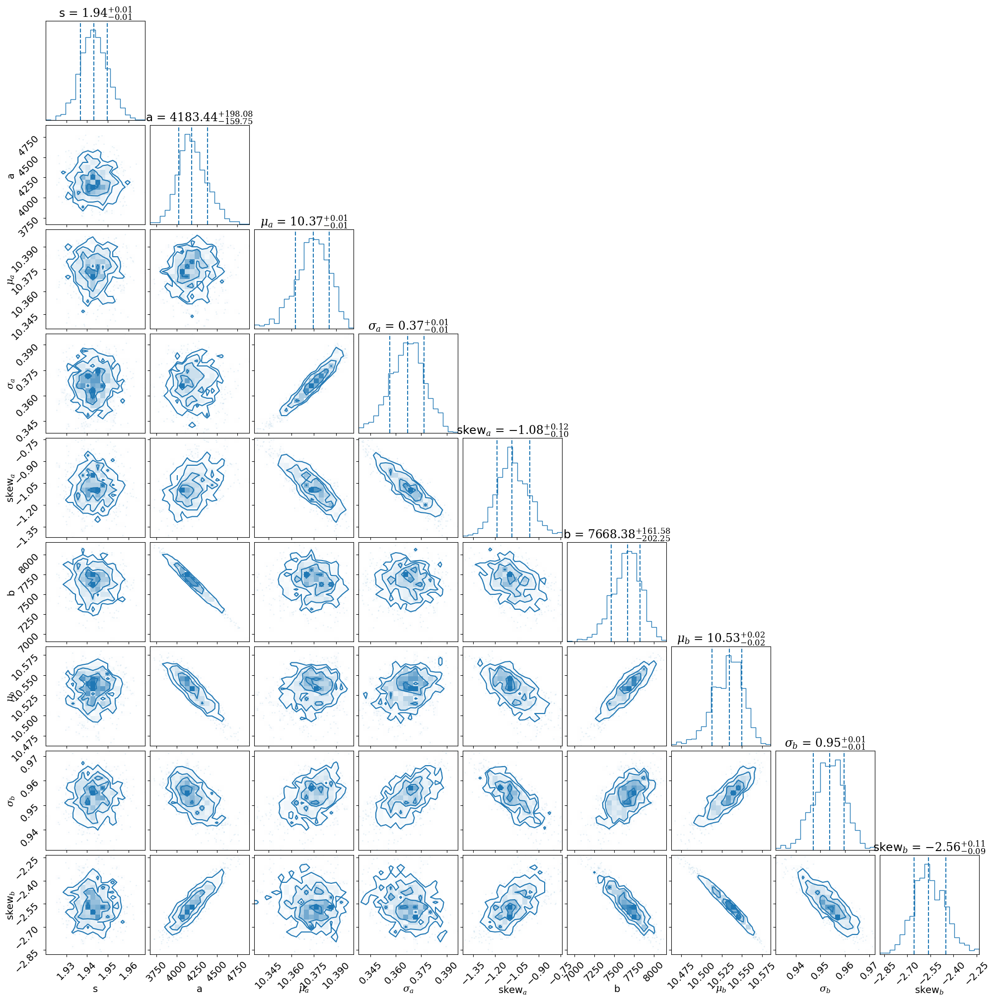

In [27]:
pc.plotting.corner(V2_0p1_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84]);

In [28]:
lnzM1_V2_0p1 = V2_0p1_results1['logz'][-1]
lnzM1_V2_0p1

-621.142507118452

In [29]:
V2_0p1_bestfit1 = np.mean(V2_0p1_results1['samples'], axis=0)

V2_0p1_bestfit1

array([ 1.9433736e+00,  4.1990488e+03,  1.0373801e+01,  3.6665070e-01,
       -1.0762223e+00,  7.6564712e+03,  1.0532090e+01,  9.5342922e-01,
       -2.5546844e+00], dtype=float32)

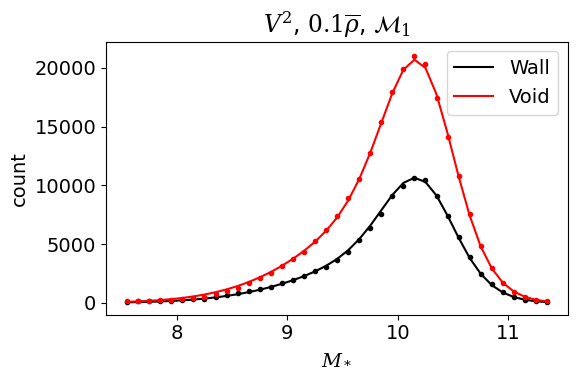

In [30]:
Model_1_plot(V2_0p1_bestfit1, 
             Mstar_NSA[wall_0p1], 
             Mstar_NSA[void_0p1], 
             Mstar_bins, 
             2, 
             xlabel_text='$M_*$', 
             title_text=r'$V^2$, $0.1\overline{\rho}$, $\mathcal{M}_1$')

### 2-parent model

In [33]:
temp_infile = open('pocoMC_results/sampler_results_M2_Mstar_V2-0p1.pickle', 'rb')
V2_0p1_results2 = pickle.load(temp_infile)
temp_infile.close()

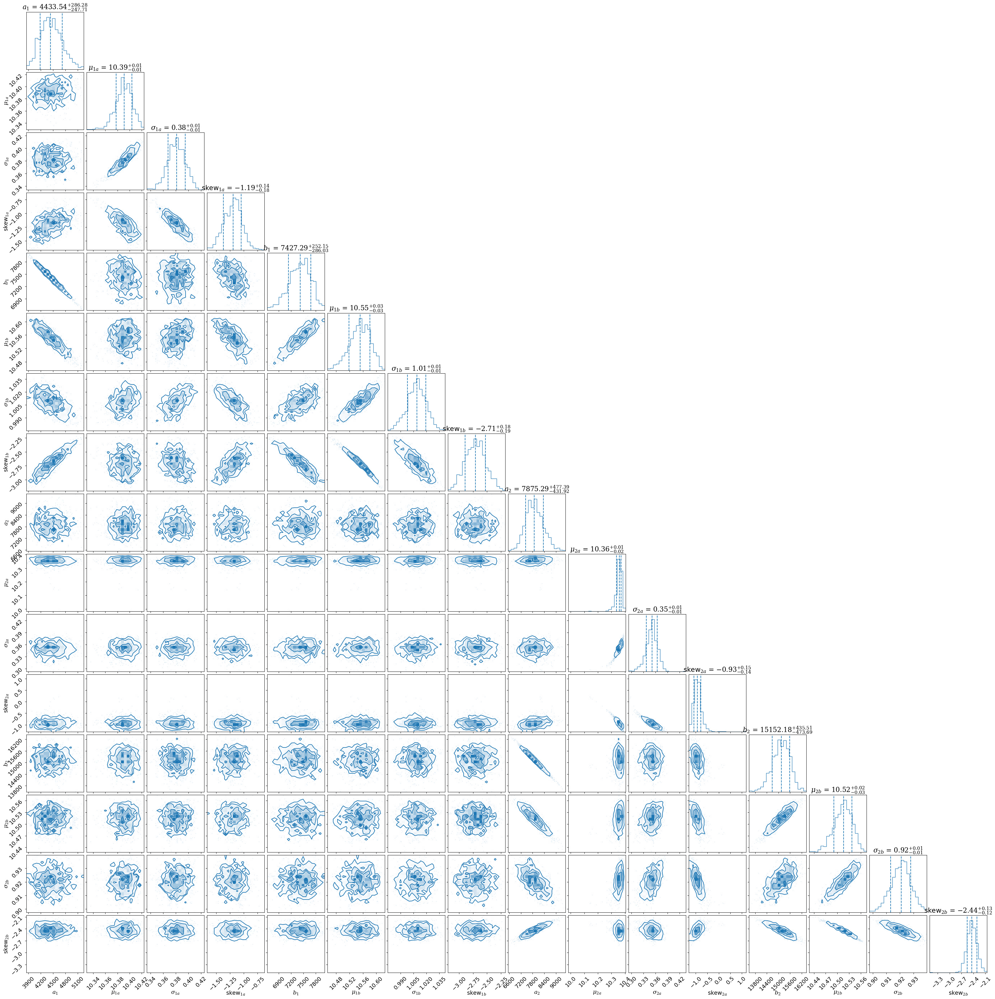

In [34]:
pc.plotting.corner(V2_0p1_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84]);

In [35]:
lnzM2_V2_0p1 = V2_0p1_results2['logz'][-1]
lnzM1_V2_0p1

-621.142507118452

In [36]:
V2_0p1_bestfit2 = np.mean(V2_0p1_results2['samples'], axis=0)

V2_0p1_bestfit2

array([ 4.4554629e+03,  1.0390522e+01,  3.8102674e-01, -1.2011311e+00,
        7.4080200e+03,  1.0549981e+01,  1.0083879e+00, -2.7071259e+00,
        7.8964326e+03,  1.0353163e+01,  3.5013488e-01, -9.2041284e-01,
        1.5130380e+04,  1.0514073e+01,  9.2071211e-01, -2.4388242e+00],
      dtype=float32)

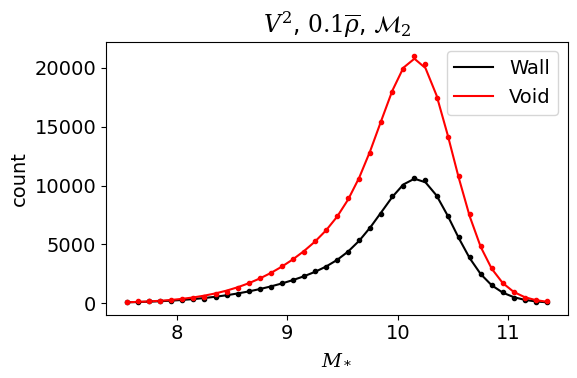

In [37]:
Model_2_plot(V2_0p1_bestfit2, 
             Mstar_NSA[wall_0p1], 
             Mstar_NSA[void_0p1], 
             Mstar_bins, 
             2, 
             xlabel_text='$M_*$', 
             title_text=r'$V^2$, $0.1\overline{\rho}$, $\mathcal{M}_2$')

### Calculate Bayes factor

In [38]:
lnB12_V2_0p1 = lnzM1_V2_0p1 - lnzM2_V2_0p1

B12_V2_0p1 = np.exp(lnB12_V2_0p1)

print('V2 M*: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2_0p1, lnB12_V2_0p1*np.log10(np.exp(1))))

V2 M*: B12 = 1.65e-43; log(B12) = -42.782


## $0.3\overline{\rho}$, $R_{\rm min} = 10$ Mpc/$h$

### 1-parent model

In [39]:
temp_infile = open('pocoMC_results/sampler_results_M1_Mstar_V2-0p3.pickle', 'rb')
V2_0p3_results1 = pickle.load(temp_infile)
temp_infile.close()

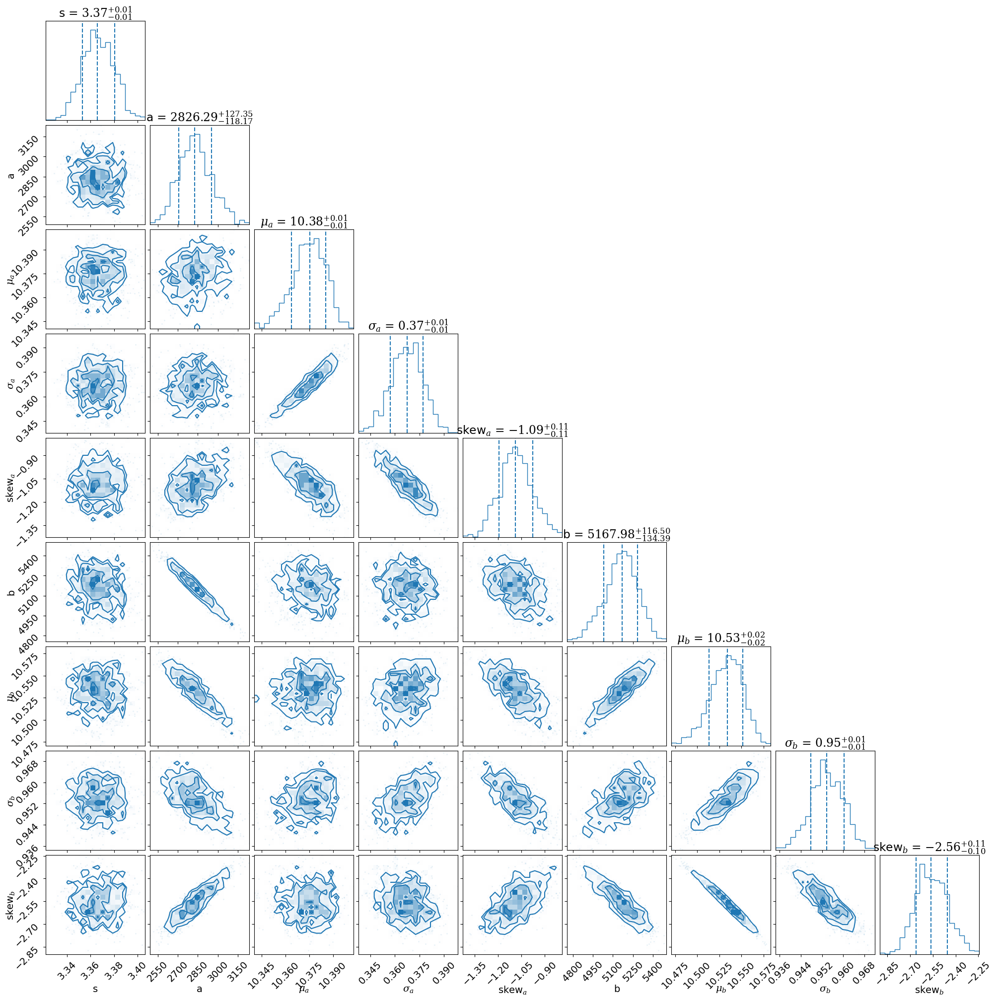

In [40]:
pc.plotting.corner(V2_0p3_results1, 
                   labels=labels1_bi, 
                   dims=range(len(labels1_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84]);

In [41]:
lnzM1_V2_0p3 = V2_0p3_results1['logz'][-1]
lnzM1_V2_0p3

-1896.058126408245

In [42]:
V2_0p3_bestfit1 = np.mean(V2_0p3_results1['samples'], axis=0)

V2_0p3_bestfit1

array([ 3.3664856e+00,  2.8310986e+03,  1.0374528e+01,  3.6726695e-01,
       -1.0839062e+00,  5.1598174e+03,  1.0532569e+01,  9.5374686e-01,
       -2.5563626e+00], dtype=float32)

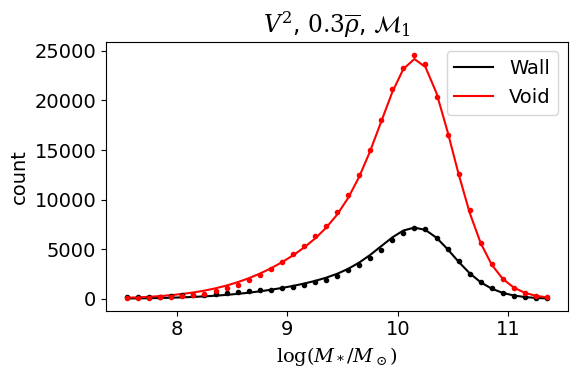

In [43]:
Model_1_plot(V2_0p3_bestfit1, 
             Mstar_NSA[wall_0p3], 
             Mstar_NSA[void_0p3], 
             Mstar_bins, 
             2, 
             xlabel_text=r'$\log(M_*/M_\odot)$', 
             title_text=r'$V^2$, $0.3\overline{\rho}$, $\mathcal{M}_1$')

### 2-parent model

In [50]:
temp_infile = open('pocoMC_results/sampler_results_M2_Mstar_V2-0p3.pickle', 'rb')
V2_0p3_results2 = pickle.load(temp_infile)
temp_infile.close()

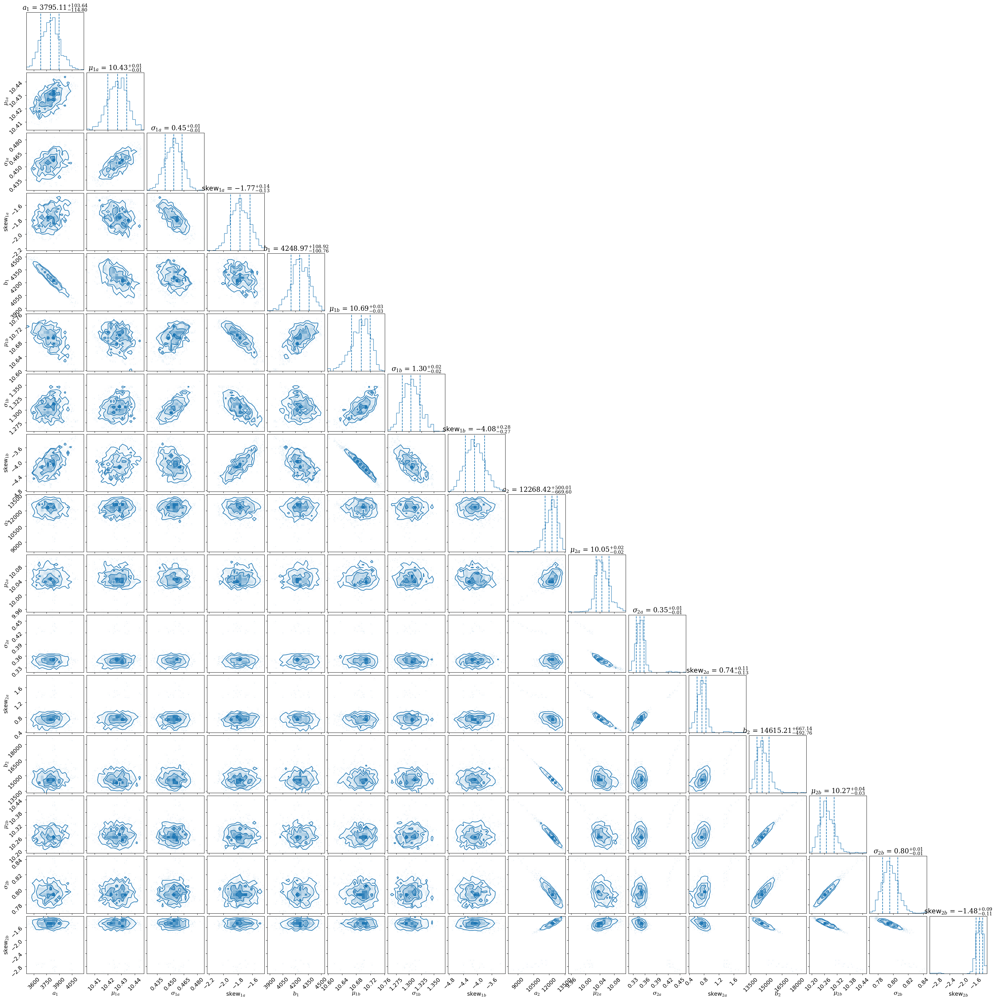

In [51]:
pc.plotting.corner(V2_0p3_results2, 
                   labels=labels2_bi, 
                   dims=range(len(labels2_bi)), 
                   show_titles=True, 
                   quantiles=[0.16, 0.5, 0.84]);

In [52]:
lnzM2_V2_0p3 = V2_0p3_results2['logz'][-1]
lnzM1_V2_0p3

-1896.058126408245

In [53]:
V2_0p3_bestfit2 = np.mean(V2_0p3_results2['samples'], axis=0)

V2_0p3_bestfit2

array([ 3.7926567e+03,  1.0427123e+01,  4.5343804e-01, -1.7705895e+00,
        4.2521133e+03,  1.0692340e+01,  1.3046573e+00, -4.0736966e+00,
        1.2182111e+04,  1.0047685e+01,  3.4887078e-01,  7.4344569e-01,
        1.4705366e+04,  1.0273533e+01,  7.9626578e-01, -1.5123152e+00],
      dtype=float32)

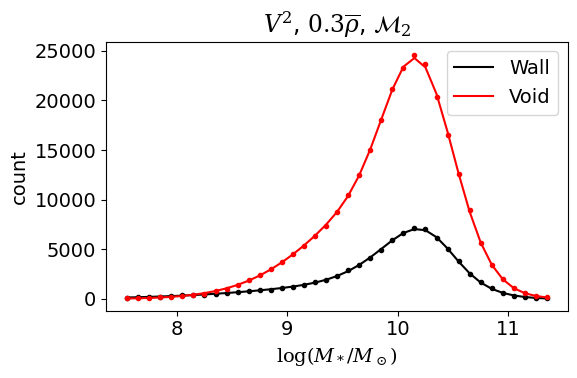

In [54]:
Model_2_plot(V2_0p3_bestfit2, 
             Mstar_NSA[wall_0p3], 
             Mstar_NSA[void_0p3], 
             Mstar_bins, 
             2, 
             xlabel_text=r'$\log (M_*/M_\odot)$', 
             title_text=r'$V^2$, $0.3\overline{\rho}$, $\mathcal{M}_2$')

### Calculate Bayes factor

In [55]:
lnB12_V2_0p3 = lnzM1_V2_0p3 - lnzM2_V2_0p3

B12_V2_0p3 = np.exp(lnB12_V2_0p3)

print('V2 M*: B12 = {:.3g}; log(B12) = {:.3f}'.format(B12_V2_0p3, lnB12_V2_0p3*np.log10(np.exp(1))))

V2 M*: B12 = 0; log(B12) = -603.949
